### After Preprocessing

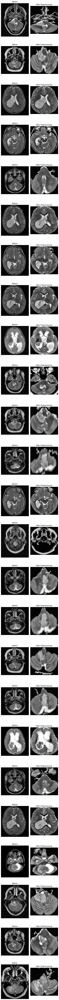

In [11]:
import cv2, os, matplotlib.pyplot as plt

before_dir = "/kaggle/input/brain-tumor-mri"
after_dir  = "/kaggle/working/brain-tumor-mri-clahe"

# Collect 25 image paths (same filenames exist in both dirs)
before_paths, after_paths = [], []
count = 0
for cls in os.listdir(before_dir):
    cls_path = os.path.join(before_dir, cls)
    if not os.path.isdir(cls_path): continue
    for f in os.listdir(cls_path):
        if not f.lower().endswith(('.jpg','.jpeg','.png')): continue
        before_paths.append(os.path.join(before_dir, cls, f))
        after_paths.append(os.path.join(after_dir, cls, f))
        count += 1
        if count >= 25: break
    if count >= 25: break

# Plot vertically: 25 rows, 2 columns (Before | After)
fig, axes = plt.subplots(nrows=25, ncols=2, figsize=(6, 100))  # tall figure
for i, (b_path, a_path) in enumerate(zip(before_paths, after_paths)):
    orig = cv2.imread(b_path, cv2.IMREAD_GRAYSCALE)
    proc = cv2.imread(a_path, cv2.IMREAD_GRAYSCALE)

    axes[i,0].imshow(orig, cmap='gray')
    axes[i,0].set_title("Before")
    axes[i,0].axis('off')

    axes[i,1].imshow(proc, cmap='gray')
    axes[i,1].set_title("After Preprocessing")
    axes[i,1].axis('off')

plt.tight_layout()
plt.show()

### Augmentations

In [11]:
import os
from tensorflow.keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img, array_to_img

input_dir = "/kaggle/working/brain-tumor-mri-clahe"
output_dir = "/kaggle/work/brain-tumor-mri-augmented"
os.makedirs(output_dir, exist_ok=True)

datagen = ImageDataGenerator(
    rotation_range=15,
    width_shift_range=0.05,
    height_shift_range=0.05,
    zoom_range=0.1,
    brightness_range=[0.9, 1.1],
    horizontal_flip=False,  
    vertical_flip=False,
    fill_mode='nearest'
)

num_aug = 5 

for cls in os.listdir(input_dir):
    cls_path = os.path.join(input_dir, cls)
    if not os.path.isdir(cls_path): continue
    save_cls = os.path.join(output_dir, cls)
    os.makedirs(save_cls, exist_ok=True)
    
    for f in os.listdir(cls_path):
        if not f.lower().endswith(('.jpg','.jpeg','.png')): continue
        img = load_img(os.path.join(cls_path, f), color_mode="grayscale")
        x = img_to_array(img)
        x = x.reshape((1,) + x.shape)
        
        prefix = os.path.splitext(f)[0]
        i = 0
        for batch in datagen.flow(x, batch_size=1,
                                  save_to_dir=save_cls,
                                  save_prefix=prefix,
                                  save_format='png'):
            i += 1
            if i >= num_aug:
                break

print(f"✅ Augmentation complete. Augmented images saved to {output_dir}")

2025-11-30 16:16:22.994641: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1764519383.221995      38 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1764519383.286153      38 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


✅ Augmentation complete. Augmented images saved to /kaggle/work/brain-tumor-mri-augmented


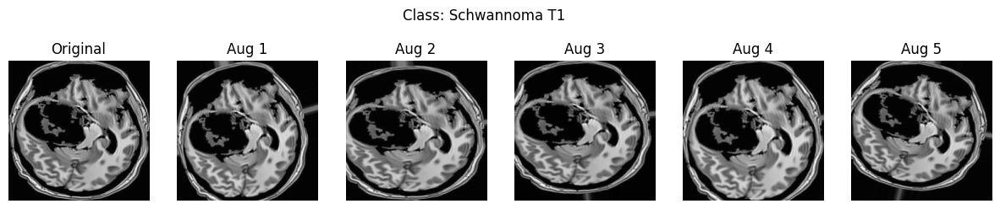

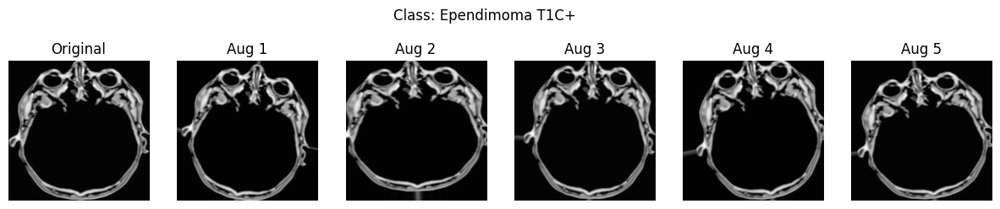

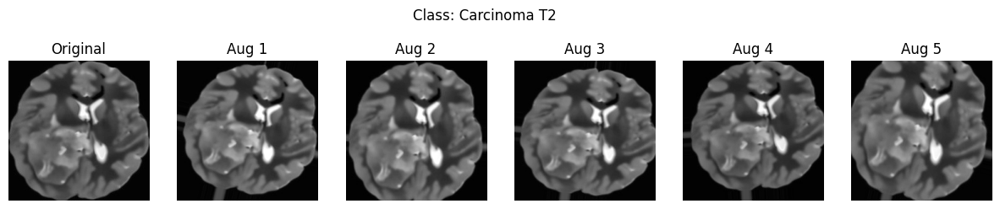

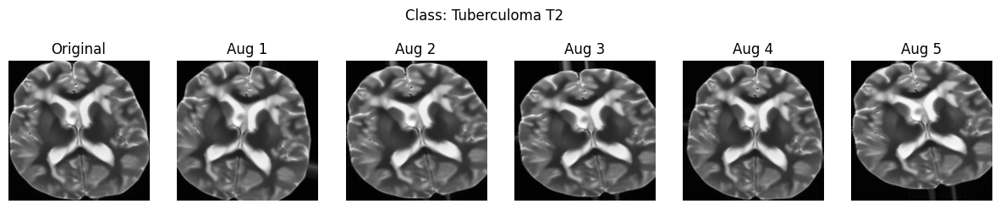

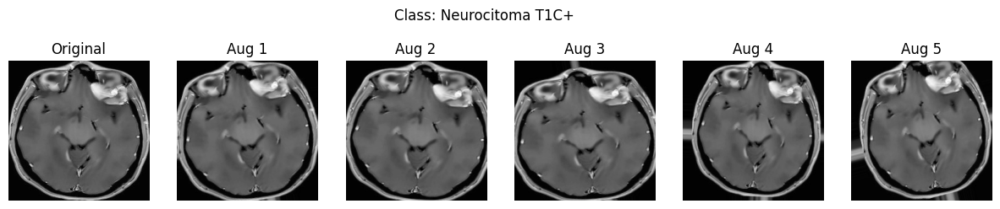

...

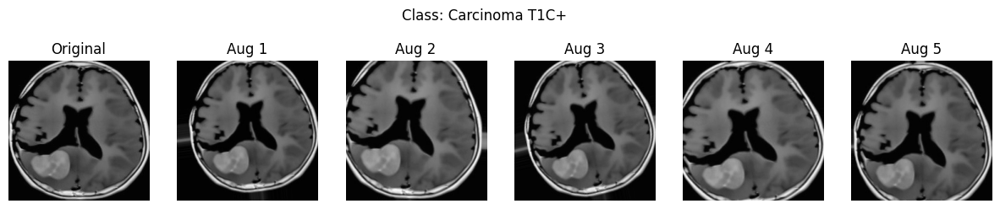

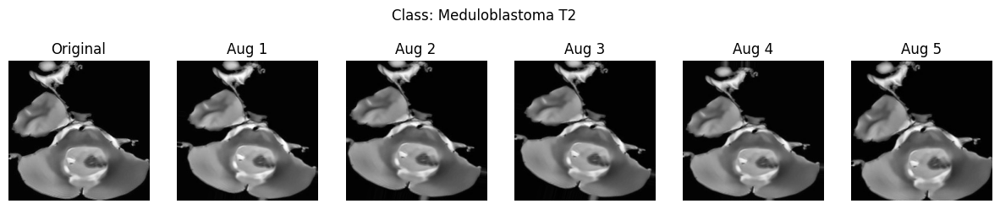

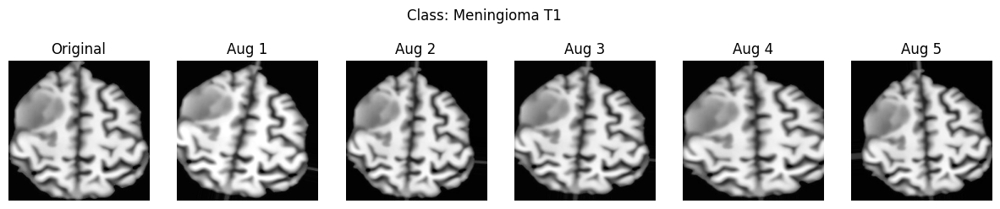

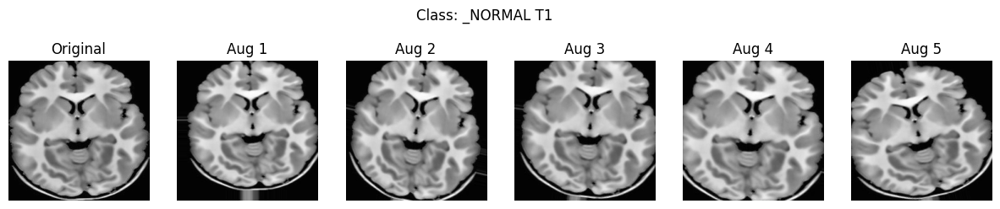

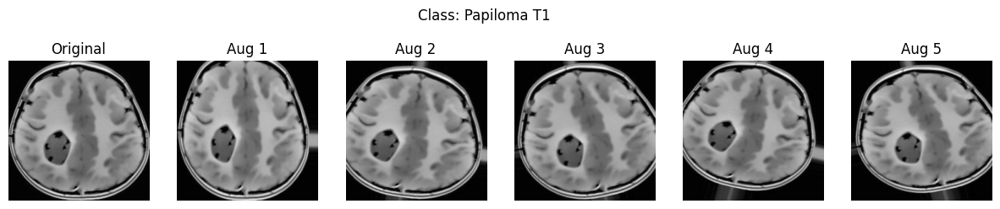

In [12]:
import os, matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

aug_dir = "/kaggle/work/brain-tumor-mri-augmented"
orig_dir = "/kaggle/working/brain-tumor-mri-clahe"

for cls in os.listdir(orig_dir):
    cls_path = os.path.join(orig_dir, cls)
    if not os.path.isdir(cls_path): continue
    
    sample_img = [f for f in os.listdir(cls_path) if f.lower().endswith(('.jpg','.png','.jpeg'))][0]
    orig = load_img(os.path.join(cls_path, sample_img), color_mode="grayscale")
    
    aug_cls_path = os.path.join(aug_dir, cls)
    prefix = os.path.splitext(sample_img)[0]
    aug_imgs = [f for f in os.listdir(aug_cls_path) if f.startswith(prefix)]
    aug_imgs = sorted(aug_imgs)[:5]  # take first 5
    
    plt.figure(figsize=(15,3))
    plt.subplot(1,6,1)
    plt.imshow(orig, cmap='gray')
    plt.title("Original")
    plt.axis("off")
    
    for i, f in enumerate(aug_imgs):
        img = load_img(os.path.join(aug_cls_path, f), color_mode="grayscale")
        plt.subplot(1,6,i+2)
        plt.imshow(img, cmap='gray')
        plt.title(f"Aug {i+1}")
        plt.axis("off")
    
    plt.suptitle(f"Class: {cls}")
    plt.show()

### Train + Val + Test (70+15+15)

In [13]:
import os, shutil, random

input_dir = "/kaggle/work/brain-tumor-mri-augmented"
output_base = "/kaggle/working/brain-tumor-mri-split"
splits = ["train","val","test"]
ratios = [0.7,0.15,0.15]

for s in splits:
    for cls in os.listdir(input_dir):
        os.makedirs(os.path.join(output_base,s,cls), exist_ok=True)

for cls in os.listdir(input_dir):
    cls_path = os.path.join(input_dir, cls)
    if not os.path.isdir(cls_path): continue
    files = [f for f in os.listdir(cls_path) if f.lower().endswith(('.jpg','.jpeg','.png'))]
    random.shuffle(files)
    n = len(files)
    n_train, n_val = int(n*ratios[0]), int(n*ratios[1])
    train_files = files[:n_train]
    val_files = files[n_train:n_train+n_val]
    test_files = files[n_train+n_val:]
    for f in train_files:
        shutil.copy(os.path.join(cls_path,f), os.path.join(output_base,"train",cls,f))
    for f in val_files:
        shutil.copy(os.path.join(cls_path,f), os.path.join(output_base,"val",cls,f))
    for f in test_files:
        shutil.copy(os.path.join(cls_path,f), os.path.join(output_base,"test",cls,f))

def count_images(path):
    total = 0
    for cls in os.listdir(path):
        cls_path = os.path.join(path, cls)
        if not os.path.isdir(cls_path): continue
        total += len([f for f in os.listdir(cls_path) if f.lower().endswith(('.jpg','.jpeg','.png'))])
    return total

print("✅ Split complete. Data saved to", output_base)
print("Train:", count_images(os.path.join(output_base,"train")))
print("Val:", count_images(os.path.join(output_base,"val")))
print("Test:", count_images(os.path.join(output_base,"test")))

✅ Split complete. Data saved to /kaggle/working/brain-tumor-mri-split
Train: 15654
Val: 3343
Test: 3391


## ResNet-18

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 202MB/s]


Epoch 01/40 | Train Loss: 1.6254 Acc: 0.5734 | Val Loss: 0.6981 Acc: 0.8056
Epoch 02/40 | Train Loss: 0.5314 Acc: 0.8679 | Val Loss: 0.3166 Acc: 0.9144
Epoch 03/40 | Train Loss: 0.2168 Acc: 0.9537 | Val Loss: 0.1417 Acc: 0.9617
Epoch 04/40 | Train Loss: 0.1106 Acc: 0.9786 | Val Loss: 0.0905 Acc: 0.9779
Epoch 05/40 | Train Loss: 0.0746 Acc: 0.9854 | Val Loss: 0.0826 Acc: 0.9749
Epoch 06/40 | Train Loss: 0.0445 Acc: 0.9916 | Val Loss: 0.0609 Acc: 0.9824
Epoch 07/40 | Train Loss: 0.0460 Acc: 0.9905 | Val Loss: 0.0712 Acc: 0.9785
Epoch 08/40 | Train Loss: 0.0588 Acc: 0.9861 | Val Loss: 0.0825 Acc: 0.9761
Epoch 09/40 | Train Loss: 0.0449 Acc: 0.9898 | Val Loss: 0.0551 Acc: 0.9827
Epoch 10/40 | Train Loss: 0.0328 Acc: 0.9936 | Val Loss: 0.0443 Acc: 0.9865
Epoch 11/40 | Train Loss: 0.0291 Acc: 0.9945 | Val Loss: 0.0433 Acc: 0.9871
Epoch 12/40 | Train Loss: 0.0523 Acc: 0.9863 | Val Loss: 0.0503 Acc: 0.9856
Epoch 13/40 | Train Loss: 0.0245 Acc: 0.9944 | Val Loss: 0.0320 Acc: 0.9898
Epoch 14/40 

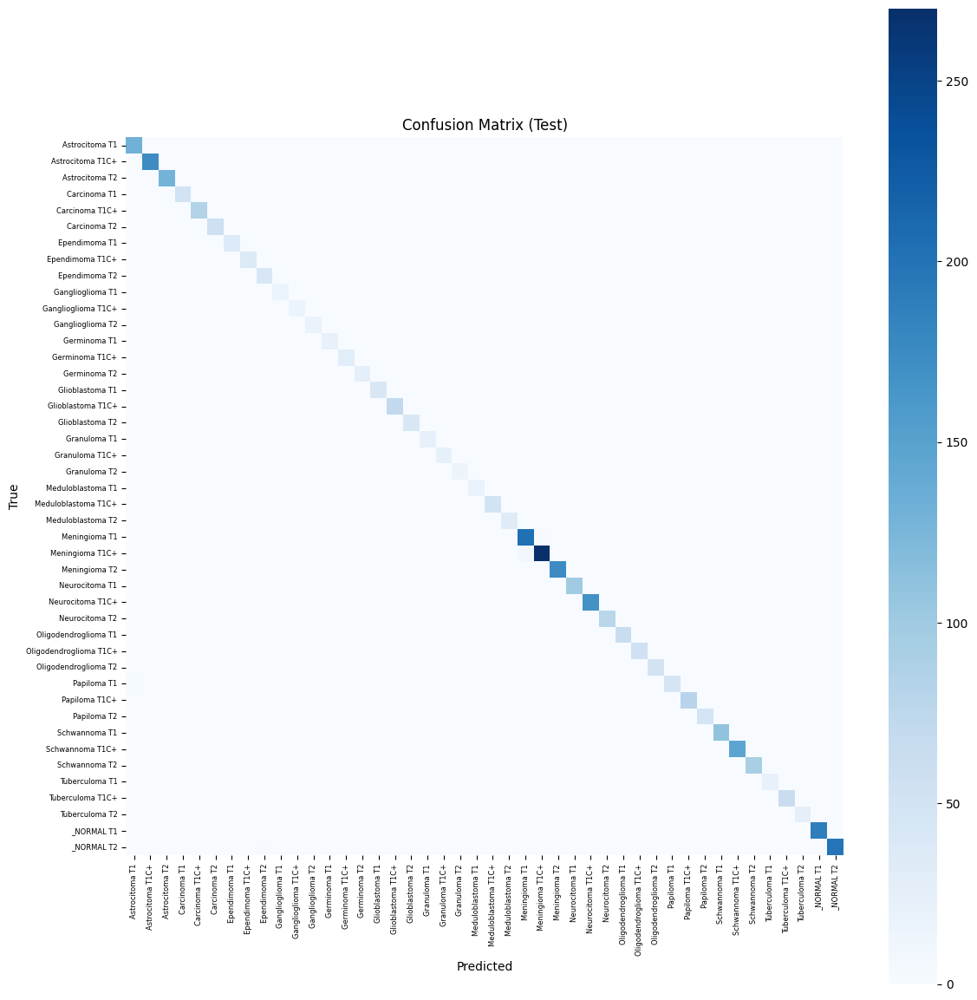

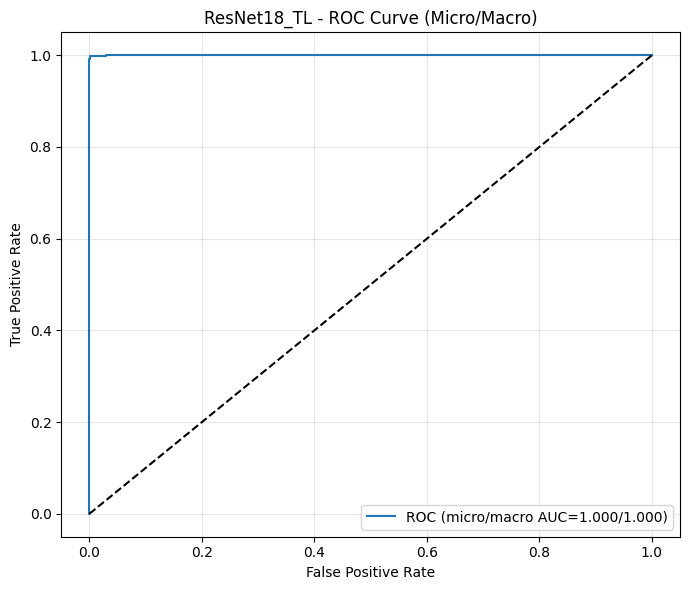

Macro AUC: 1.0000 | Micro AUC: 1.0000

Timing:
Training time: 1263.20 s
Testing time (test set evaluation): 6.36 s
Average inference time per image: 5.86 ms


In [19]:
import os, time, random, numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns

seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

data_root = "/kaggle/working/brain-tumor-mri-split"
train_dir = os.path.join(data_root, "train")
val_dir   = os.path.join(data_root, "val")
test_dir  = os.path.join(data_root, "test")

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]
img_size = 224

train_tfms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(img_size),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

eval_tfms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(img_size),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

train_ds = datasets.ImageFolder(train_dir, transform=train_tfms)
val_ds   = datasets.ImageFolder(val_dir,   transform=eval_tfms)
test_ds  = datasets.ImageFolder(test_dir,  transform=eval_tfms)

class_names = train_ds.classes
num_classes = len(class_names)

batch_size = 32
num_workers = 2
pin_memory = torch.cuda.is_available()

train_loader = torch.utils.data.DataLoader(train_ds, batch_size=batch_size, shuffle=True,
                                           num_workers=num_workers, pin_memory=pin_memory)
val_loader   = torch.utils.data.DataLoader(val_ds,   batch_size=batch_size, shuffle=False,
                                           num_workers=num_workers, pin_memory=pin_memory)
test_loader  = torch.utils.data.DataLoader(test_ds,  batch_size=batch_size, shuffle=False,
                                           num_workers=num_workers, pin_memory=pin_memory)

weights = models.ResNet18_Weights.IMAGENET1K_V1
model = models.resnet18(weights=weights)
in_features = model.fc.in_features
model.fc = nn.Sequential(
    nn.Dropout(p=0.5),
    nn.Linear(in_features, num_classes)
)
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)

def print_model_summary(m, input_size=(1, 3, img_size, img_size)):
    try:
        from torchinfo import summary
        print(summary(m, input_size=input_size,
                      col_names=("input_size","output_size","num_params","trainable")))
    except Exception:
        print(m)
        total_params = sum(p.numel() for p in m.parameters())
        trainable_params = sum(p.numel() for p in m.parameters() if p.requires_grad)
        print(f"Total params: {total_params:,}")
        print(f"Trainable params: {trainable_params:,}")

epochs = 40
patience = 5
best_val_loss = float("inf")
epochs_no_improve = 0
best_state = None

def run_epoch(loader, train_mode=True):
    if train_mode:
        model.train()
    else:
        model.eval()
    running_loss, running_correct, total = 0.0, 0, 0
    for images, targets in loader:
        images, targets = images.to(device), targets.to(device)
        if train_mode:
            optimizer.zero_grad()
        with torch.set_grad_enabled(train_mode):
            outputs = model(images)
            loss = criterion(outputs, targets)
            if train_mode:
                loss.backward()
                optimizer.step()
        preds = outputs.argmax(dim=1)
        running_loss += loss.item() * images.size(0)
        running_correct += (preds == targets).sum().item()
        total += images.size(0)
    epoch_loss = running_loss / max(total, 1)
    epoch_acc = running_correct / max(total, 1)
    return epoch_loss, epoch_acc

t_train_start = time.time()
for epoch in range(1, epochs + 1):
    train_loss, train_acc = run_epoch(train_loader, train_mode=True)
    val_loss, val_acc = run_epoch(val_loader, train_mode=False)
    print(f"Epoch {epoch:02d}/{epochs} | "
          f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f}")
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        epochs_no_improve = 0
        best_state = {k: v.cpu() for k, v in model.state_dict().items()}
    else:
        epochs_no_improve += 1
        if epochs_no_improve >= patience:
            print(f"Early stopping at epoch {epoch}.")
            break
t_train_end = time.time()
train_time_s = t_train_end - t_train_start

if best_state is not None:
    model.load_state_dict({k: v.to(device) for k, v in best_state.items()})

print("\nModel summary (post-training):")
print_model_summary(model)

@torch.no_grad()
def collect_preds(loader):
    model.eval()
    all_preds, all_targets = [], []
    for images, targets in loader:
        images = images.to(device)
        outputs = model(images)
        preds = outputs.argmax(dim=1).cpu().numpy()
        all_preds.append(preds)
        all_targets.append(targets.numpy())
    all_preds = np.concatenate(all_preds)
    all_targets = np.concatenate(all_targets)
    return all_targets, all_preds

@torch.no_grad()
def collect_preds_and_probs(loader):
    model.eval()
    all_probs, all_preds, all_targets = [], [], []
    for images, targets in loader:
        images = images.to(device)
        logits = model(images)
        probs = torch.softmax(logits, dim=1)
        preds = probs.argmax(dim=1).cpu().numpy()
        all_probs.append(probs.cpu().numpy())
        all_preds.append(preds)
        all_targets.append(targets.numpy())
    all_probs = np.concatenate(all_probs)
    all_preds = np.concatenate(all_preds)
    all_targets = np.concatenate(all_targets)
    return all_targets, all_preds, all_probs

def plot_roc_auc(y_true, y_prob, labels, title):
    y_true_bin = label_binarize(y_true, classes=list(range(len(labels))))
    macro_auc = roc_auc_score(y_true_bin, y_prob, multi_class="ovr", average="macro")
    micro_auc = roc_auc_score(y_true_bin, y_prob, multi_class="ovr", average="micro")
    fpr, tpr, _ = roc_curve(y_true_bin.ravel(), y_prob.ravel())
    plt.figure(figsize=(7, 6))
    plt.plot(fpr, tpr, label=f"ROC (micro/macro AUC={micro_auc:.3f}/{macro_auc:.3f})")
    plt.plot([0, 1], [0, 1], "k--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(title)
    plt.legend(loc="lower right")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
    print(f"Macro AUC: {macro_auc:.4f} | Micro AUC: {micro_auc:.4f}")

print("\nClassification report - TRAIN:")
y_true_tr, y_pred_tr = collect_preds(train_loader)
print(classification_report(y_true_tr, y_pred_tr, target_names=class_names,
                            zero_division=0, digits=4))

print("\nClassification report - VAL:")
y_true_va, y_pred_va = collect_preds(val_loader)
print(classification_report(y_true_va, y_pred_va, target_names=class_names,
                            zero_division=0, digits=4))

print("\nClassification report - TEST:")
t_test_start = time.time()
y_true_te, y_pred_te, y_prob_te = collect_preds_and_probs(test_loader)
t_test_end = time.time()
test_time_s = t_test_end - t_test_start
print(classification_report(y_true_te, y_pred_te, target_names=class_names,
                            zero_division=0, digits=4))

cm = confusion_matrix(y_true_te, y_pred_te, labels=range(num_classes))
plt.figure(figsize=(12, 12))
sns.heatmap(cm, cmap="Blues", cbar=True, square=True,
            xticklabels=class_names, yticklabels=class_names)
plt.xticks(rotation=90, fontsize=6)
plt.yticks(rotation=0, fontsize=6)
plt.title("Confusion Matrix (Test)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.tight_layout()
plt.show()

plot_roc_auc(y_true_te, y_prob_te, class_names,
             "ResNet18_TL - ROC Curve (Micro/Macro)")

@torch.no_grad()
def measure_inference_time(dataset, max_samples=100):
    indices = list(range(len(dataset)))
    random.shuffle(indices)
    indices = indices[:min(max_samples, len(indices))]
    single_loader = torch.utils.data.DataLoader(
        torch.utils.data.Subset(dataset, indices),
        batch_size=1, shuffle=False, num_workers=0, pin_memory=pin_memory
    )
    if device.type == "cuda":
        torch.cuda.empty_cache()
    for i, (x, _) in enumerate(single_loader):
        x = x.to(device)
        _ = model(x)
        if i >= 5:
            break
    start = time.time()
    for x, _ in single_loader:
        x = x.to(device)
        if device.type == "cuda":
            torch.cuda.synchronize()
        _ = model(x)
        if device.type == "cuda":
            torch.cuda.synchronize()
    end = time.time()
    n = len(indices)
    return (end - start) / n if n > 0 else float("nan")

avg_inf_s = measure_inference_time(test_ds, max_samples=100)

print(f"\nTiming:")
print(f"Training time: {train_time_s:.2f} s")
print(f"Testing time (test set evaluation): {test_time_s:.2f} s")
print(f"Average inference time per image: {avg_inf_s*1000:.2f} ms")


### DenseNet 121

Downloading: "https://download.pytorch.org/models/densenet121-a639ec97.pth" to /root/.cache/torch/hub/checkpoints/densenet121-a639ec97.pth
100%|██████████| 30.8M/30.8M [00:00<00:00, 202MB/s]


Epoch 01/40 | Train Loss: 1.8992 Acc: 0.5093 | Val Loss: 0.8864 Acc: 0.7658
Epoch 02/40 | Train Loss: 0.7086 Acc: 0.8241 | Val Loss: 0.3571 Acc: 0.9115
Epoch 03/40 | Train Loss: 0.3140 Acc: 0.9286 | Val Loss: 0.1826 Acc: 0.9530
Epoch 04/40 | Train Loss: 0.1641 Acc: 0.9665 | Val Loss: 0.1060 Acc: 0.9722
Epoch 05/40 | Train Loss: 0.1105 Acc: 0.9751 | Val Loss: 0.0895 Acc: 0.9743
Epoch 06/40 | Train Loss: 0.0915 Acc: 0.9789 | Val Loss: 0.0780 Acc: 0.9764
Epoch 07/40 | Train Loss: 0.0715 Acc: 0.9836 | Val Loss: 0.0859 Acc: 0.9797
Epoch 08/40 | Train Loss: 0.0606 Acc: 0.9859 | Val Loss: 0.0825 Acc: 0.9773
Epoch 09/40 | Train Loss: 0.0623 Acc: 0.9849 | Val Loss: 0.0937 Acc: 0.9740
Epoch 10/40 | Train Loss: 0.0572 Acc: 0.9852 | Val Loss: 0.0610 Acc: 0.9829
Epoch 11/40 | Train Loss: 0.0350 Acc: 0.9915 | Val Loss: 0.0350 Acc: 0.9883
Epoch 12/40 | Train Loss: 0.0411 Acc: 0.9895 | Val Loss: 0.0547 Acc: 0.9847
Epoch 13/40 | Train Loss: 0.0529 Acc: 0.9862 | Val Loss: 0.0405 Acc: 0.9877
Epoch 14/40 

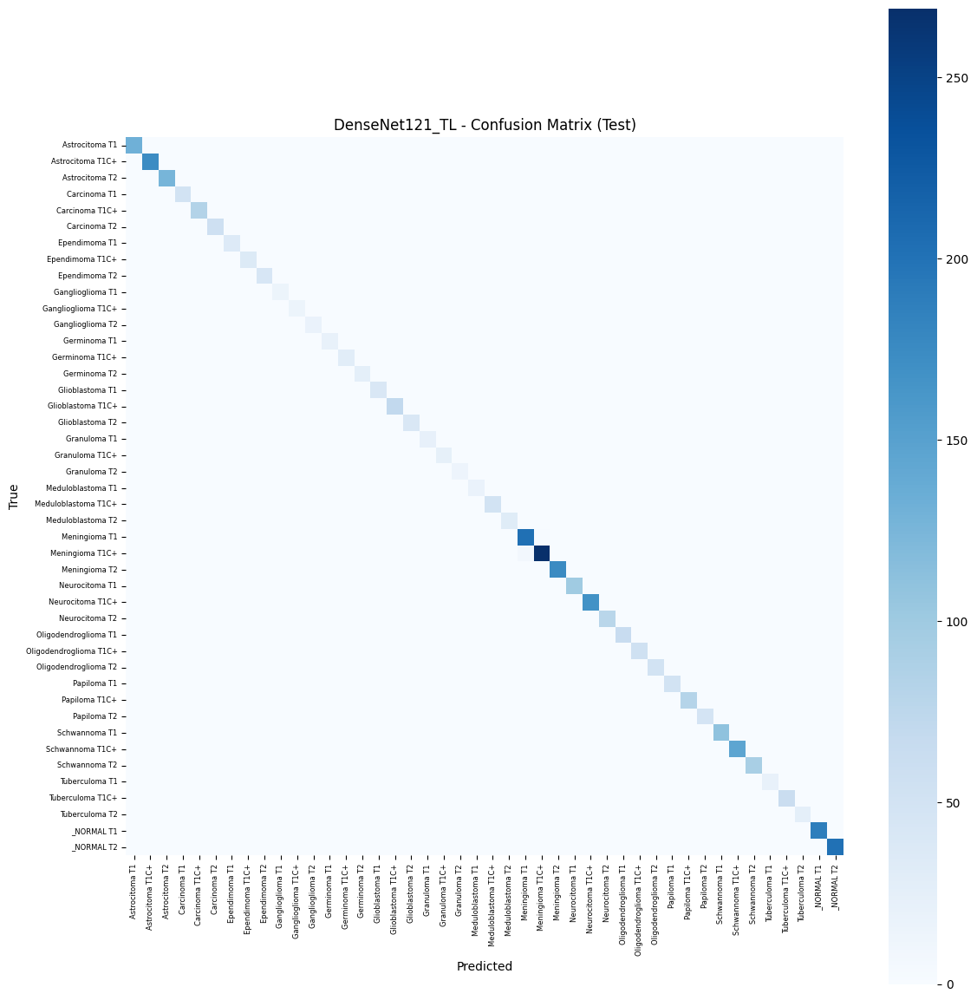

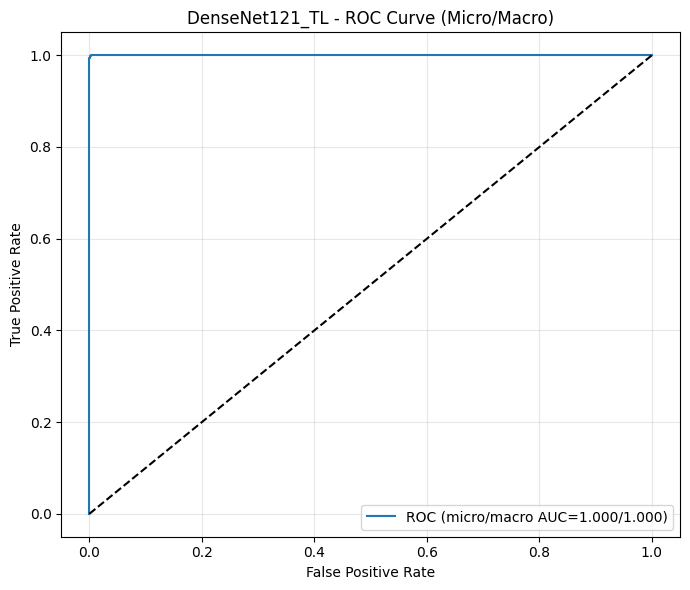

Macro AUC: 1.0000 | Micro AUC: 1.0000

Timing:
Training time: 4392.53 s
Testing time (test set evaluation): 11.96 s
Average inference time per image: 18.88 ms


In [20]:
import os, time, random, numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns

seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

data_root = "/kaggle/working/brain-tumor-mri-split"
train_dir = os.path.join(data_root, "train")
val_dir   = os.path.join(data_root, "val")
test_dir  = os.path.join(data_root, "test")

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]
img_size = 224

train_tfms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(img_size),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

eval_tfms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(img_size),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

train_ds = datasets.ImageFolder(train_dir, transform=train_tfms)
val_ds   = datasets.ImageFolder(val_dir,   transform=eval_tfms)
test_ds  = datasets.ImageFolder(test_dir,  transform=eval_tfms)

class_names = train_ds.classes
num_classes = len(class_names)

batch_size = 32
num_workers = 2
pin_memory = torch.cuda.is_available()

train_loader = torch.utils.data.DataLoader(train_ds, batch_size=batch_size, shuffle=True,
                                           num_workers=num_workers, pin_memory=pin_memory)
val_loader   = torch.utils.data.DataLoader(val_ds,   batch_size=batch_size, shuffle=False,
                                           num_workers=num_workers, pin_memory=pin_memory)
test_loader  = torch.utils.data.DataLoader(test_ds,  batch_size=batch_size, shuffle=False,
                                           num_workers=num_workers, pin_memory=pin_memory)

weights = models.DenseNet121_Weights.IMAGENET1K_V1
model = models.densenet121(weights=weights)
in_features = model.classifier.in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.5),
    nn.Linear(in_features, num_classes)
)
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)

def print_model_summary(m, input_size=(1, 3, img_size, img_size)):
    try:
        from torchinfo import summary
        print(summary(m, input_size=input_size,
                      col_names=("input_size","output_size","num_params","trainable")))
    except Exception:
        print(m)
        total_params = sum(p.numel() for p in m.parameters())
        trainable_params = sum(p.numel() for p in m.parameters() if p.requires_grad)
        print(f"Total params: {total_params:,}")
        print(f"Trainable params: {trainable_params:,}")

epochs = 40
patience = 5
best_val_loss = float("inf")
epochs_no_improve = 0
best_state = None

def run_epoch(loader, train_mode=True):
    if train_mode:
        model.train()
    else:
        model.eval()
    running_loss, running_correct, total = 0.0, 0, 0
    for images, targets in loader:
        images, targets = images.to(device), targets.to(device)
        if train_mode:
            optimizer.zero_grad()
        with torch.set_grad_enabled(train_mode):
            outputs = model(images)
            loss = criterion(outputs, targets)
            if train_mode:
                loss.backward()
                optimizer.step()
        preds = outputs.argmax(dim=1)
        running_loss += loss.item() * images.size(0)
        running_correct += (preds == targets).sum().item()
        total += images.size(0)
    epoch_loss = running_loss / max(total, 1)
    epoch_acc = running_correct / max(total, 1)
    return epoch_loss, epoch_acc

t_train_start = time.time()
for epoch in range(1, epochs + 1):
    train_loss, train_acc = run_epoch(train_loader, train_mode=True)
    val_loss, val_acc = run_epoch(val_loader, train_mode=False)
    print(f"Epoch {epoch:02d}/{epochs} | "
          f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f}")
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        epochs_no_improve = 0
        best_state = {k: v.cpu() for k, v in model.state_dict().items()}
    else:
        epochs_no_improve += 1
        if epochs_no_improve >= patience:
            print(f"Early stopping at epoch {epoch}.")
            break
t_train_end = time.time()
train_time_s = t_train_end - t_train_start

if best_state is not None:
    model.load_state_dict({k: v.to(device) for k, v in best_state.items()})

print("\nModel summary (post-training):")
print_model_summary(model)

@torch.no_grad()
def collect_preds(loader):
    model.eval()
    all_preds, all_targets = [], []
    for images, targets in loader:
        images = images.to(device)
        outputs = model(images)
        preds = outputs.argmax(dim=1).cpu().numpy()
        all_preds.append(preds)
        all_targets.append(targets.numpy())
    all_preds = np.concatenate(all_preds)
    all_targets = np.concatenate(all_targets)
    return all_targets, all_preds

@torch.no_grad()
def collect_preds_and_probs(loader):
    model.eval()
    all_probs, all_preds, all_targets = [], [], []
    for images, targets in loader:
        images = images.to(device)
        logits = model(images)
        probs = torch.softmax(logits, dim=1)
        preds = probs.argmax(dim=1).cpu().numpy()
        all_probs.append(probs.cpu().numpy())
        all_preds.append(preds)
        all_targets.append(targets.numpy())
    all_probs = np.concatenate(all_probs)
    all_preds = np.concatenate(all_preds)
    all_targets = np.concatenate(all_targets)
    return all_targets, all_preds, all_probs

def plot_roc_auc(y_true, y_prob, labels, title):
    y_true_bin = label_binarize(y_true, classes=list(range(len(labels))))
    macro_auc = roc_auc_score(y_true_bin, y_prob, multi_class="ovr", average="macro")
    micro_auc = roc_auc_score(y_true_bin, y_prob, multi_class="ovr", average="micro")
    fpr, tpr, _ = roc_curve(y_true_bin.ravel(), y_prob.ravel())
    plt.figure(figsize=(7, 6))
    plt.plot(fpr, tpr, label=f"ROC (micro/macro AUC={micro_auc:.3f}/{macro_auc:.3f})")
    plt.plot([0, 1], [0, 1], "k--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(title)
    plt.legend(loc="lower right")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
    print(f"Macro AUC: {macro_auc:.4f} | Micro AUC: {micro_auc:.4f}")

print("\nClassification report - TRAIN:")
y_true_tr, y_pred_tr = collect_preds(train_loader)
print(classification_report(y_true_tr, y_pred_tr, target_names=class_names,
                            zero_division=0, digits=4))

print("\nClassification report - VAL:")
y_true_va, y_pred_va = collect_preds(val_loader)
print(classification_report(y_true_va, y_pred_va, target_names=class_names,
                            zero_division=0, digits=4))

print("\nClassification report - TEST:")
t_test_start = time.time()
y_true_te, y_pred_te, y_prob_te = collect_preds_and_probs(test_loader)
t_test_end = time.time()
test_time_s = t_test_end - t_test_start
print(classification_report(y_true_te, y_pred_te, target_names=class_names,
                            zero_division=0, digits=4))

cm = confusion_matrix(y_true_te, y_pred_te, labels=range(num_classes))
plt.figure(figsize=(12, 12))
sns.heatmap(cm, cmap="Blues", cbar=True, square=True,
            xticklabels=class_names, yticklabels=class_names)
plt.xticks(rotation=90, fontsize=6)
plt.yticks(rotation=0, fontsize=6)
plt.title("DenseNet121_TL - Confusion Matrix (Test)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.tight_layout()
plt.show()

plot_roc_auc(y_true_te, y_prob_te, class_names,
             "DenseNet121_TL - ROC Curve (Micro/Macro)")

@torch.no_grad()
def measure_inference_time(dataset, max_samples=100):
    indices = list(range(len(dataset)))
    random.shuffle(indices)
    indices = indices[:min(max_samples, len(indices))]
    single_loader = torch.utils.data.DataLoader(
        torch.utils.data.Subset(dataset, indices),
        batch_size=1, shuffle=False, num_workers=0, pin_memory=pin_memory
    )
    if device.type == "cuda":
        torch.cuda.empty_cache()
    for i, (x, _) in enumerate(single_loader):
        x = x.to(device)
        _ = model(x)
        if i >= 5:
            break
    start = time.time()
    for x, _ in single_loader:
        x = x.to(device)
        if device.type == "cuda":
            torch.cuda.synchronize()
        _ = model(x)
        if device.type == "cuda":
            torch.cuda.synchronize()
    end = time.time()
    n = len(indices)
    return (end - start) / n if n > 0 else float("nan")

avg_inf_s = measure_inference_time(test_ds, max_samples=100)

print(f"\nTiming:")
print(f"Training time: {train_time_s:.2f} s")
print(f"Testing time (test set evaluation): {test_time_s:.2f} s")
print(f"Average inference time per image: {avg_inf_s*1000:.2f} ms")


### VGG-16

Downloading: "https://download.pytorch.org/models/vgg16-397923af.pth" to /root/.cache/torch/hub/checkpoints/vgg16-397923af.pth
100%|██████████| 528M/528M [00:02<00:00, 224MB/s] 


Epoch 01/40 | Train Loss: 1.6805 Acc: 0.5154 | Val Loss: 0.8217 Acc: 0.7589
Epoch 02/40 | Train Loss: 0.5795 Acc: 0.8244 | Val Loss: 0.3583 Acc: 0.8956
Epoch 03/40 | Train Loss: 0.2961 Acc: 0.9095 | Val Loss: 0.2712 Acc: 0.9198
Epoch 04/40 | Train Loss: 0.1803 Acc: 0.9463 | Val Loss: 0.2040 Acc: 0.9363
Epoch 05/40 | Train Loss: 0.1334 Acc: 0.9607 | Val Loss: 0.1764 Acc: 0.9438
Epoch 06/40 | Train Loss: 0.1137 Acc: 0.9658 | Val Loss: 0.1157 Acc: 0.9614
Epoch 07/40 | Train Loss: 0.0884 Acc: 0.9739 | Val Loss: 0.1335 Acc: 0.9599
Epoch 08/40 | Train Loss: 0.0806 Acc: 0.9754 | Val Loss: 0.1225 Acc: 0.9584
Epoch 09/40 | Train Loss: 0.0839 Acc: 0.9760 | Val Loss: 0.1401 Acc: 0.9551
Epoch 10/40 | Train Loss: 0.0669 Acc: 0.9796 | Val Loss: 0.1559 Acc: 0.9563
Epoch 11/40 | Train Loss: 0.0719 Acc: 0.9800 | Val Loss: 0.1023 Acc: 0.9656
Epoch 12/40 | Train Loss: 0.0651 Acc: 0.9807 | Val Loss: 0.1275 Acc: 0.9608
Epoch 13/40 | Train Loss: 0.0691 Acc: 0.9796 | Val Loss: 0.0817 Acc: 0.9761
Epoch 14/40 

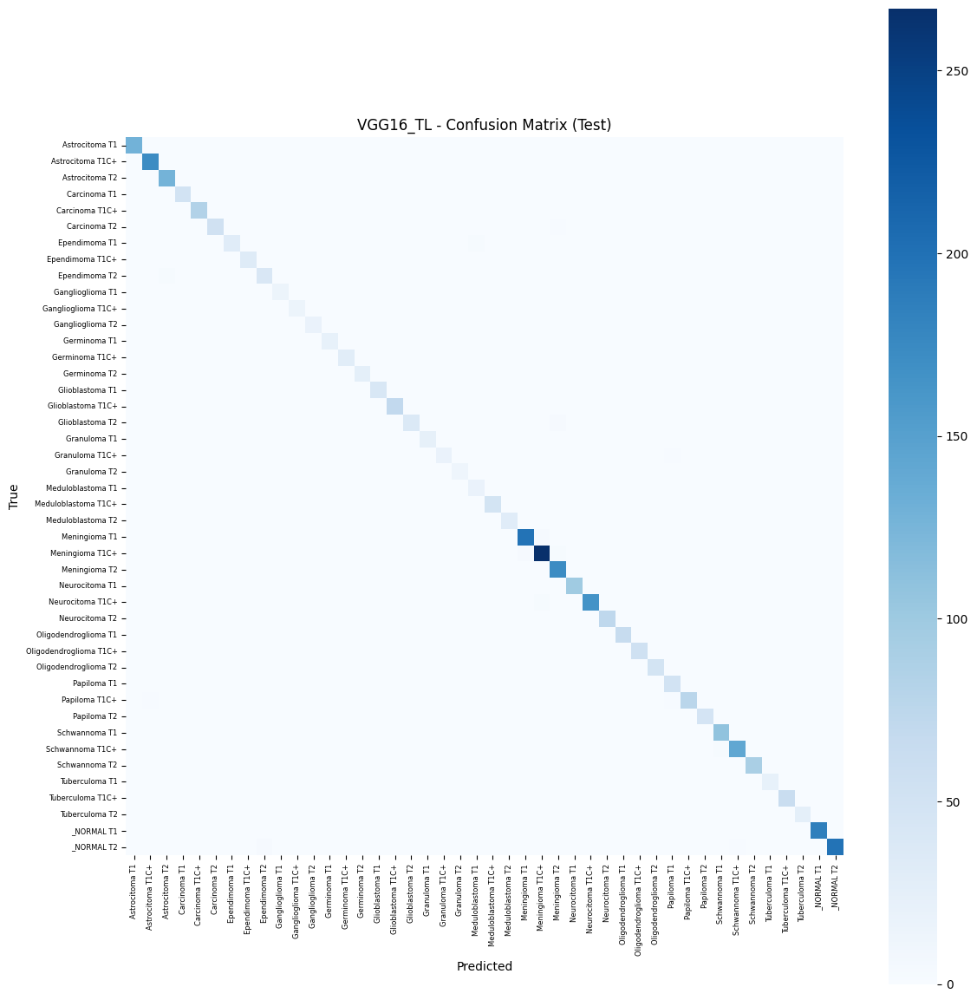

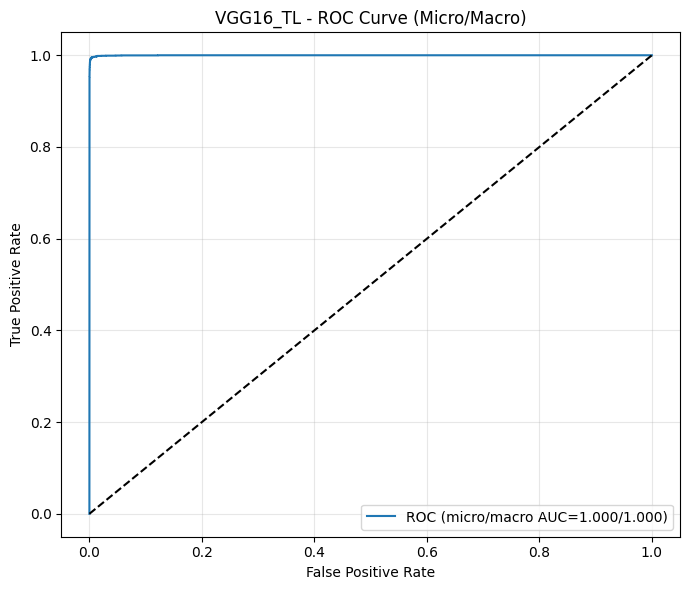

Macro AUC: 0.9998 | Micro AUC: 0.9998

Timing:
Training time: 6159.14 s
Testing time (test set evaluation): 21.60 s
Average inference time per image: 11.82 ms


In [21]:
import os, time, random, numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms, models
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns

seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

data_root = "/kaggle/working/brain-tumor-mri-split"
train_dir = os.path.join(data_root, "train")
val_dir   = os.path.join(data_root, "val")
test_dir  = os.path.join(data_root, "test")

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]
img_size = 224

train_tfms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(img_size),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

eval_tfms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(img_size),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

train_ds = datasets.ImageFolder(train_dir, transform=train_tfms)
val_ds   = datasets.ImageFolder(val_dir,   transform=eval_tfms)
test_ds  = datasets.ImageFolder(test_dir,  transform=eval_tfms)

class_names = train_ds.classes
num_classes = len(class_names)

batch_size = 32
num_workers = 2
pin_memory = torch.cuda.is_available()

train_loader = torch.utils.data.DataLoader(train_ds, batch_size=batch_size, shuffle=True,
                                           num_workers=num_workers, pin_memory=pin_memory)
val_loader   = torch.utils.data.DataLoader(val_ds,   batch_size=batch_size, shuffle=False,
                                           num_workers=num_workers, pin_memory=pin_memory)
test_loader  = torch.utils.data.DataLoader(test_ds,  batch_size=batch_size, shuffle=False,
                                           num_workers=num_workers, pin_memory=pin_memory)

weights = models.VGG16_Weights.IMAGENET1K_V1
model = models.vgg16(weights=weights)
in_features = model.classifier[-1].in_features
model.classifier[-1] = nn.Linear(in_features, num_classes)
model = model.to(device)

criterion = nn.CrossEntropyLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4, weight_decay=1e-4)

def print_model_summary(m, input_size=(1, 3, img_size, img_size)):
    try:
        from torchinfo import summary
        print(summary(m, input_size=input_size,
                      col_names=("input_size","output_size","num_params","trainable")))
    except Exception:
        print(m)
        total_params = sum(p.numel() for p in m.parameters())
        trainable_params = sum(p.numel() for p in m.parameters() if p.requires_grad)
        print(f"Total params: {total_params:,}")
        print(f"Trainable params: {trainable_params:,}")

epochs = 40
patience = 5
best_val_loss = float("inf")
epochs_no_improve = 0
best_state = None

def run_epoch(loader, train_mode=True):
    if train_mode:
        model.train()
    else:
        model.eval()
    running_loss, running_correct, total = 0.0, 0, 0
    for images, targets in loader:
        images, targets = images.to(device), targets.to(device)
        if train_mode:
            optimizer.zero_grad()
        with torch.set_grad_enabled(train_mode):
            outputs = model(images)
            loss = criterion(outputs, targets)
            if train_mode:
                loss.backward()
                optimizer.step()
        preds = outputs.argmax(dim=1)
        running_loss += loss.item() * images.size(0)
        running_correct += (preds == targets).sum().item()
        total += images.size(0)
    epoch_loss = running_loss / max(total, 1)
    epoch_acc = running_correct / max(total, 1)
    return epoch_loss, epoch_acc

t_train_start = time.time()
for epoch in range(1, epochs + 1):
    train_loss, train_acc = run_epoch(train_loader, train_mode=True)
    val_loss, val_acc = run_epoch(val_loader, train_mode=False)
    print(f"Epoch {epoch:02d}/{epochs} | "
          f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | "
          f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f}")
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        epochs_no_improve = 0
        best_state = {k: v.cpu() for k, v in model.state_dict().items()}
    else:
        epochs_no_improve += 1
        if epochs_no_improve >= patience:
            print(f"Early stopping at epoch {epoch}.")
            break
t_train_end = time.time()
train_time_s = t_train_end - t_train_start

if best_state is not None:
    model.load_state_dict({k: v.to(device) for k, v in best_state.items()})

print("\nModel summary (post-training):")
print_model_summary(model)

@torch.no_grad()
def collect_preds(loader):
    model.eval()
    all_preds, all_targets = [], []
    for images, targets in loader:
        images = images.to(device)
        outputs = model(images)
        preds = outputs.argmax(dim=1).cpu().numpy()
        all_preds.append(preds)
        all_targets.append(targets.numpy())
    all_preds = np.concatenate(all_preds)
    all_targets = np.concatenate(all_targets)
    return all_targets, all_preds

@torch.no_grad()
def collect_preds_and_probs(loader):
    model.eval()
    all_probs, all_preds, all_targets = [], [], []
    for images, targets in loader:
        images = images.to(device)
        logits = model(images)
        probs = torch.softmax(logits, dim=1)
        preds = probs.argmax(dim=1).cpu().numpy()
        all_probs.append(probs.cpu().numpy())
        all_preds.append(preds)
        all_targets.append(targets.numpy())
    all_probs = np.concatenate(all_probs)
    all_preds = np.concatenate(all_preds)
    all_targets = np.concatenate(all_targets)
    return all_targets, all_preds, all_probs

def plot_roc_auc(y_true, y_prob, labels, title):
    y_true_bin = label_binarize(y_true, classes=list(range(len(labels))))
    macro_auc = roc_auc_score(y_true_bin, y_prob, multi_class="ovr", average="macro")
    micro_auc = roc_auc_score(y_true_bin, y_prob, multi_class="ovr", average="micro")
    fpr, tpr, _ = roc_curve(y_true_bin.ravel(), y_prob.ravel())
    plt.figure(figsize=(7, 6))
    plt.plot(fpr, tpr, label=f"ROC (micro/macro AUC={micro_auc:.3f}/{macro_auc:.3f})")
    plt.plot([0, 1], [0, 1], "k--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(title)
    plt.legend(loc="lower right")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
    print(f"Macro AUC: {macro_auc:.4f} | Micro AUC: {micro_auc:.4f}")

print("\nClassification report - TRAIN:")
y_true_tr, y_pred_tr = collect_preds(train_loader)
print(classification_report(y_true_tr, y_pred_tr, target_names=class_names,
                            zero_division=0, digits=4))

print("\nClassification report - VAL:")
y_true_va, y_pred_va = collect_preds(val_loader)
print(classification_report(y_true_va, y_pred_va, target_names=class_names,
                            zero_division=0, digits=4))

print("\nClassification report - TEST:")
t_test_start = time.time()
y_true_te, y_pred_te, y_prob_te = collect_preds_and_probs(test_loader)
t_test_end = time.time()
test_time_s = t_test_end - t_test_start
print(classification_report(y_true_te, y_pred_te, target_names=class_names,
                            zero_division=0, digits=4))

cm = confusion_matrix(y_true_te, y_pred_te, labels=range(num_classes))
plt.figure(figsize=(12, 12))
sns.heatmap(cm, cmap="Blues", cbar=True, square=True,
            xticklabels=class_names, yticklabels=class_names)
plt.xticks(rotation=90, fontsize=6)
plt.yticks(rotation=0, fontsize=6)
plt.title("VGG16_TL - Confusion Matrix (Test)")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.tight_layout()
plt.show()

plot_roc_auc(y_true_te, y_prob_te, class_names,
             "VGG16_TL - ROC Curve (Micro/Macro)")

@torch.no_grad()
def measure_inference_time(dataset, max_samples=100):
    indices = list(range(len(dataset)))
    random.shuffle(indices)
    indices = indices[:min(max_samples, len(indices))]
    single_loader = torch.utils.data.DataLoader(
        torch.utils.data.Subset(dataset, indices),
        batch_size=1, shuffle=False, num_workers=0, pin_memory=pin_memory
    )
    if device.type == "cuda":
        torch.cuda.empty_cache()
    for i, (x, _) in enumerate(single_loader):
        x = x.to(device)
        _ = model(x)
        if i >= 5:
            break
    start = time.time()
    for x, _ in single_loader:
        x = x.to(device)
        if device.type == "cuda":
            torch.cuda.synchronize()
        _ = model(x)
        if device.type == "cuda":
            torch.cuda.synchronize()
    end = time.time()
    n = len(indices)
    return (end - start) / n if n > 0 else float("nan")

avg_inf_s = measure_inference_time(test_ds, max_samples=100)

print(f"\nTiming:")
print(f"Training time: {train_time_s:.2f} s")
print(f"Testing time (test set evaluation): {test_time_s:.2f} s")
print(f"Average inference time per image: {avg_inf_s*1000:.2f} ms")


### Cutom CNN


Training Custom CNN (from scratch)
[CustomCNN] Epoch 01/100 | Train Loss: 2.8130 Acc: 0.2092 | Val Loss: 2.7326 Acc: 0.2261
[CustomCNN] Epoch 02/100 | Train Loss: 2.3826 Acc: 0.2955 | Val Loss: 2.0812 Acc: 0.3850
[CustomCNN] Epoch 03/100 | Train Loss: 2.1649 Acc: 0.3521 | Val Loss: 2.0211 Acc: 0.3853
[CustomCNN] Epoch 04/100 | Train Loss: 2.0144 Acc: 0.3858 | Val Loss: 2.1864 Acc: 0.3398
[CustomCNN] Epoch 05/100 | Train Loss: 1.8915 Acc: 0.4239 | Val Loss: 1.8557 Acc: 0.4346
[CustomCNN] Epoch 06/100 | Train Loss: 1.7928 Acc: 0.4488 | Val Loss: 2.5630 Acc: 0.3356
[CustomCNN] Epoch 07/100 | Train Loss: 1.7162 Acc: 0.4713 | Val Loss: 1.6729 Acc: 0.4852
[CustomCNN] Epoch 08/100 | Train Loss: 1.6403 Acc: 0.4909 | Val Loss: 1.4895 Acc: 0.5277
[CustomCNN] Epoch 09/100 | Train Loss: 1.5766 Acc: 0.5095 | Val Loss: 1.6255 Acc: 0.5115
[CustomCNN] Epoch 10/100 | Train Loss: 1.5349 Acc: 0.5169 | Val Loss: 1.5409 Acc: 0.5220
[CustomCNN] Epoch 11/100 | Train Loss: 1.4800 Acc: 0.5339 | Val Loss: 1.44

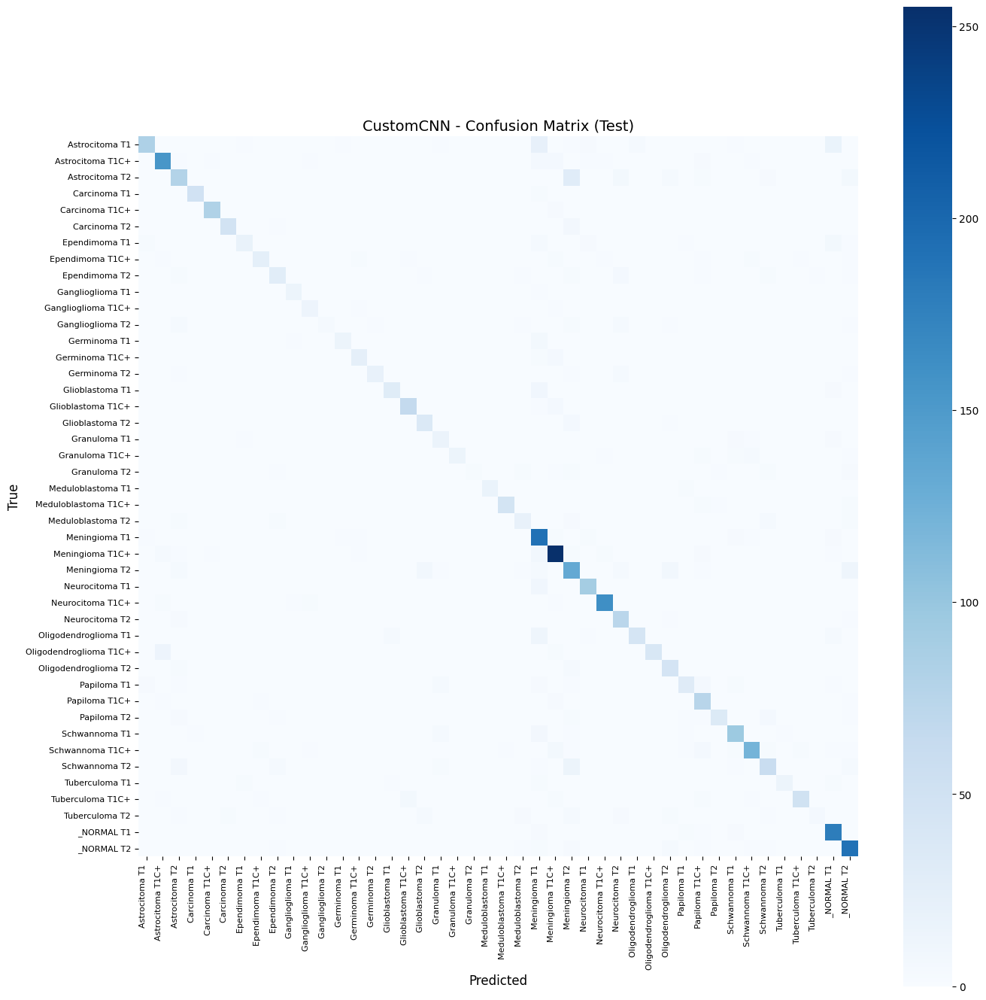

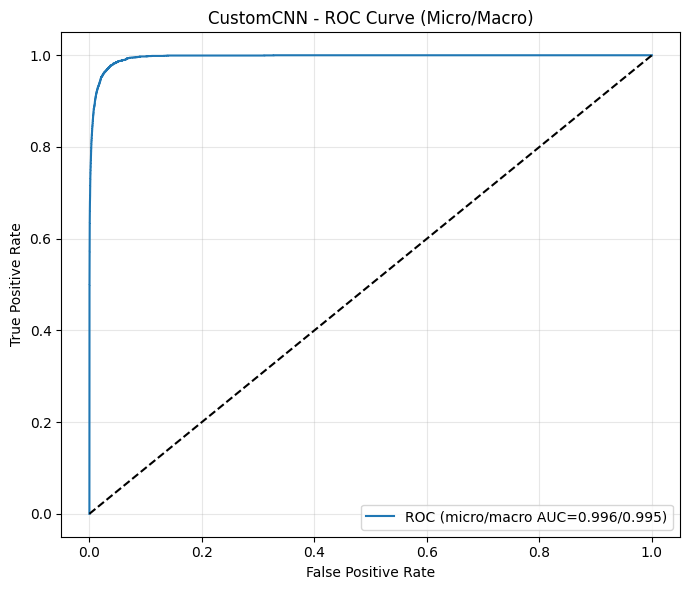

Macro AUC: 0.9953 | Micro AUC: 0.9960

[CustomCNN] Timing:
Training time: 2137.79 s
Testing time: 6.23 s
Average inference time per image: 3.73 ms



In [17]:
import os, time, random, numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import datasets, transforms
from sklearn.metrics import classification_report, confusion_matrix, roc_auc_score, roc_curve
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns

seed = 42
random.seed(seed)
np.random.seed(seed)
torch.manual_seed(seed)
torch.cuda.manual_seed_all(seed)
torch.backends.cudnn.deterministic = True
torch.backends.cudnn.benchmark = False

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

data_root = "/kaggle/working/brain-tumor-mri-split"
train_dir = os.path.join(data_root, "train")
val_dir   = os.path.join(data_root, "val")
test_dir  = os.path.join(data_root, "test")

IMAGENET_MEAN = [0.485, 0.456, 0.406]
IMAGENET_STD  = [0.229, 0.224, 0.225]
img_size = 224

train_tfms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(img_size),
    transforms.RandomHorizontalFlip(p=0.5),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

eval_tfms = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.CenterCrop(img_size),
    transforms.ToTensor(),
    transforms.Normalize(mean=IMAGENET_MEAN, std=IMAGENET_STD),
])

train_ds = datasets.ImageFolder(train_dir, transform=train_tfms)
val_ds   = datasets.ImageFolder(val_dir,   transform=eval_tfms)
test_ds  = datasets.ImageFolder(test_dir,  transform=eval_tfms)

class_names = train_ds.classes
num_classes = len(class_names)

batch_size = 32
num_workers = 2
pin_memory = torch.cuda.is_available()

train_loader = torch.utils.data.DataLoader(train_ds, batch_size=batch_size, shuffle=True,
                                           num_workers=num_workers, pin_memory=pin_memory)
val_loader   = torch.utils.data.DataLoader(val_ds,   batch_size=batch_size, shuffle=False,
                                           num_workers=num_workers, pin_memory=pin_memory)
test_loader  = torch.utils.data.DataLoader(test_ds,  batch_size=batch_size, shuffle=False,
                                           num_workers=num_workers, pin_memory=pin_memory)

def print_model_summary(m, input_size=(1, 3, img_size, img_size)):
    try:
        from torchinfo import summary
        print(summary(m, input_size=input_size,
                      col_names=("input_size","output_size","num_params","trainable")))
    except Exception:
        print(m)
        total_params = sum(p.numel() for p in m.parameters())
        trainable_params = sum(p.numel() for p in m.parameters() if p.requires_grad)
        print(f"Total params: {total_params:,}")
        print(f"Trainable params: {trainable_params:,}")

class CustomCNN(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.features = nn.Sequential(
            nn.Conv2d(3, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),

            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),

            nn.Conv2d(64, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),

            nn.Conv2d(128, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            nn.MaxPool2d(2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(256, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        x = self.classifier(x)
        return x

criterion = nn.CrossEntropyLoss()

def run_epoch(model, loader, optimizer=None, train_mode=True):
    if train_mode:
        model.train()
    else:
        model.eval()
    running_loss, running_correct, total = 0.0, 0, 0
    for images, targets in loader:
        images, targets = images.to(device), targets.to(device)
        if train_mode:
            optimizer.zero_grad()
        with torch.set_grad_enabled(train_mode):
            outputs = model(images)
            loss = criterion(outputs, targets)
            if train_mode:
                loss.backward()
                optimizer.step()
        preds = outputs.argmax(dim=1)
        running_loss += loss.item() * images.size(0)
        running_correct += (preds == targets).sum().item()
        total += images.size(0)
    epoch_loss = running_loss / max(total, 1)
    epoch_acc = running_correct / max(total, 1)
    return epoch_loss, epoch_acc

@torch.no_grad()
def collect_preds(model, loader):
    model.eval()
    all_preds, all_targets = [], []
    for images, targets in loader:
        images = images.to(device)
        outputs = model(images)
        preds = outputs.argmax(dim=1).cpu().numpy()
        all_preds.append(preds)
        all_targets.append(targets.numpy())
    all_preds = np.concatenate(all_preds)
    all_targets = np.concatenate(all_targets)
    return all_targets, all_preds

@torch.no_grad()
def collect_preds_and_probs(model, loader):
    model.eval()
    all_probs, all_preds, all_targets = [], [], []
    for images, targets in loader:
        images = images.to(device)
        logits = model(images)
        probs = torch.softmax(logits, dim=1)
        preds = probs.argmax(dim=1).cpu().numpy()
        all_probs.append(probs.cpu().numpy())
        all_preds.append(preds)
        all_targets.append(targets.numpy())
    all_probs = np.concatenate(all_probs)
    all_preds = np.concatenate(all_preds)
    all_targets = np.concatenate(all_targets)
    return all_targets, all_preds, all_probs

@torch.no_grad()
def measure_inference_time(model, dataset, max_samples=100):
    indices = list(range(len(dataset)))
    random.shuffle(indices)
    indices = indices[:min(max_samples, len(indices))]
    single_loader = torch.utils.data.DataLoader(
        torch.utils.data.Subset(dataset, indices),
        batch_size=1, shuffle=False, num_workers=0, pin_memory=pin_memory
    )
    if device.type == "cuda":
        torch.cuda.empty_cache()
    for i, (x, _) in enumerate(single_loader):
        x = x.to(device)
        _ = model(x)
        if i >= 5:
            break
    start = time.time()
    for x, _ in single_loader:
        x = x.to(device)
        if device.type == "cuda":
            torch.cuda.synchronize()
        _ = model(x)
        if device.type == "cuda":
            torch.cuda.synchronize()
    end = time.time()
    n = len(indices)
    return (end - start) / n if n > 0 else float("nan")

def plot_confusion_matrix(y_true, y_pred, labels, title):
    cm = confusion_matrix(y_true, y_pred, labels=range(len(labels)))
    plt.figure(figsize=(14, 14))
    sns.heatmap(cm, cmap="Blues", cbar=True, square=True,
                xticklabels=labels, yticklabels=labels,
                annot=False)
    plt.xticks(rotation=90, ha="right", fontsize=8)
    plt.yticks(rotation=0, fontsize=8)
    plt.title(title, fontsize=14)
    plt.xlabel("Predicted", fontsize=12)
    plt.ylabel("True", fontsize=12)
    plt.tight_layout()
    plt.show()

def plot_roc_auc(y_true, y_prob, labels, title):
    y_true_bin = label_binarize(y_true, classes=list(range(len(labels))))
    macro_auc = roc_auc_score(y_true_bin, y_prob, multi_class="ovr", average="macro")
    micro_auc = roc_auc_score(y_true_bin, y_prob, multi_class="ovr", average="micro")
    fpr, tpr, _ = roc_curve(y_true_bin.ravel(), y_prob.ravel())
    plt.figure(figsize=(7, 6))
    plt.plot(fpr, tpr, label=f"ROC (micro/macro AUC={micro_auc:.3f}/{macro_auc:.3f})")
    plt.plot([0, 1], [0, 1], "k--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(title)
    plt.legend(loc="lower right")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
    print(f"Macro AUC: {macro_auc:.4f} | Micro AUC: {micro_auc:.4f}")

def train_and_evaluate(model, model_name, epochs, patience, lr, weight_decay):
    model = model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    best_val_loss = float("inf")
    best_state = None
    epochs_no_improve = 0

    t_train_start = time.time()
    for epoch in range(1, epochs + 1):
        train_loss, train_acc = run_epoch(model, train_loader, optimizer, train_mode=True)
        val_loss, val_acc = run_epoch(model, val_loader, train_mode=False)
        print(f"[{model_name}] Epoch {epoch:02d}/{epochs} | "
              f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | "
              f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f}")
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            epochs_no_improve = 0
            best_state = {k: v.cpu() for k, v in model.state_dict().items()}
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print(f"[{model_name}] Early stopping at epoch {epoch}.")
                break
    t_train_end = time.time()
    train_time_s = t_train_end - t_train_start

    if best_state is not None:
        model.load_state_dict({k: v.to(device) for k, v in best_state.items()})

    print(f"\n[{model_name}] Model summary (post-training):")
    print_model_summary(model)

    print(f"\n[{model_name}] Classification report - TRAIN:")
    y_true_tr, y_pred_tr = collect_preds(model, train_loader)
    print(classification_report(y_true_tr, y_pred_tr, target_names=class_names,
                                zero_division=0, digits=4))

    print(f"\n[{model_name}] Classification report - VAL:")
    y_true_va, y_pred_va = collect_preds(model, val_loader)
    print(classification_report(y_true_va, y_pred_va, target_names=class_names,
                                zero_division=0, digits=4))

    print(f"\n[{model_name}] Classification report - TEST:")
    t_test_start = time.time()
    y_true_te, y_pred_te, y_prob_te = collect_preds_and_probs(model, test_loader)
    t_test_end = time.time()
    test_time_s = t_test_end - t_test_start
    print(classification_report(y_true_te, y_pred_te, target_names=class_names,
                                zero_division=0, digits=4))

    plot_confusion_matrix(y_true_te, y_pred_te, class_names,
                          f"{model_name} - Confusion Matrix (Test)")

    plot_roc_auc(y_true_te, y_prob_te, class_names,
                 f"{model_name} - ROC Curve (Micro/Macro)")

    avg_inf_s = measure_inference_time(model, test_ds, max_samples=100)

    print(f"\n[{model_name}] Timing:")
    print(f"Training time: {train_time_s:.2f} s")
    print(f"Testing time: {test_time_s:.2f} s")
    print(f"Average inference time per image: {avg_inf_s*1000:.2f} ms\n")

    return model

print("\nTraining Custom CNN (from scratch)")
custom_cnn = CustomCNN(num_classes=num_classes)
custom_cnn = train_and_evaluate(
    model=custom_cnn,
    model_name="CustomCNN",
    epochs=100,
    patience=5,
    lr=1e-3,
    weight_decay=0.0
)


### Attention-Enhanced CNN Model for Improved Brain Tumor Classification


=== Training Attention-Enhanced Custom CNN (SE Block) ===
[AttentionCustomCNN_SE] Epoch 01/100 | Train Loss: 2.8063 Acc: 0.2132 | Val Loss: 2.4937 Acc: 0.2740
[AttentionCustomCNN_SE] Epoch 02/100 | Train Loss: 2.3149 Acc: 0.3135 | Val Loss: 2.0760 Acc: 0.3844
[AttentionCustomCNN_SE] Epoch 03/100 | Train Loss: 2.0723 Acc: 0.3756 | Val Loss: 2.1479 Acc: 0.3467
[AttentionCustomCNN_SE] Epoch 04/100 | Train Loss: 1.9055 Acc: 0.4200 | Val Loss: 1.8655 Acc: 0.4272
[AttentionCustomCNN_SE] Epoch 05/100 | Train Loss: 1.7361 Acc: 0.4697 | Val Loss: 1.8166 Acc: 0.4334
[AttentionCustomCNN_SE] Epoch 06/100 | Train Loss: 1.6317 Acc: 0.5010 | Val Loss: 1.5191 Acc: 0.5193
[AttentionCustomCNN_SE] Epoch 07/100 | Train Loss: 1.5349 Acc: 0.5209 | Val Loss: 1.5741 Acc: 0.5049
[AttentionCustomCNN_SE] Epoch 08/100 | Train Loss: 1.4446 Acc: 0.5443 | Val Loss: 1.2581 Acc: 0.6081
[AttentionCustomCNN_SE] Epoch 09/100 | Train Loss: 1.3651 Acc: 0.5668 | Val Loss: 1.3211 Acc: 0.5878
[AttentionCustomCNN_SE] Epoch 10

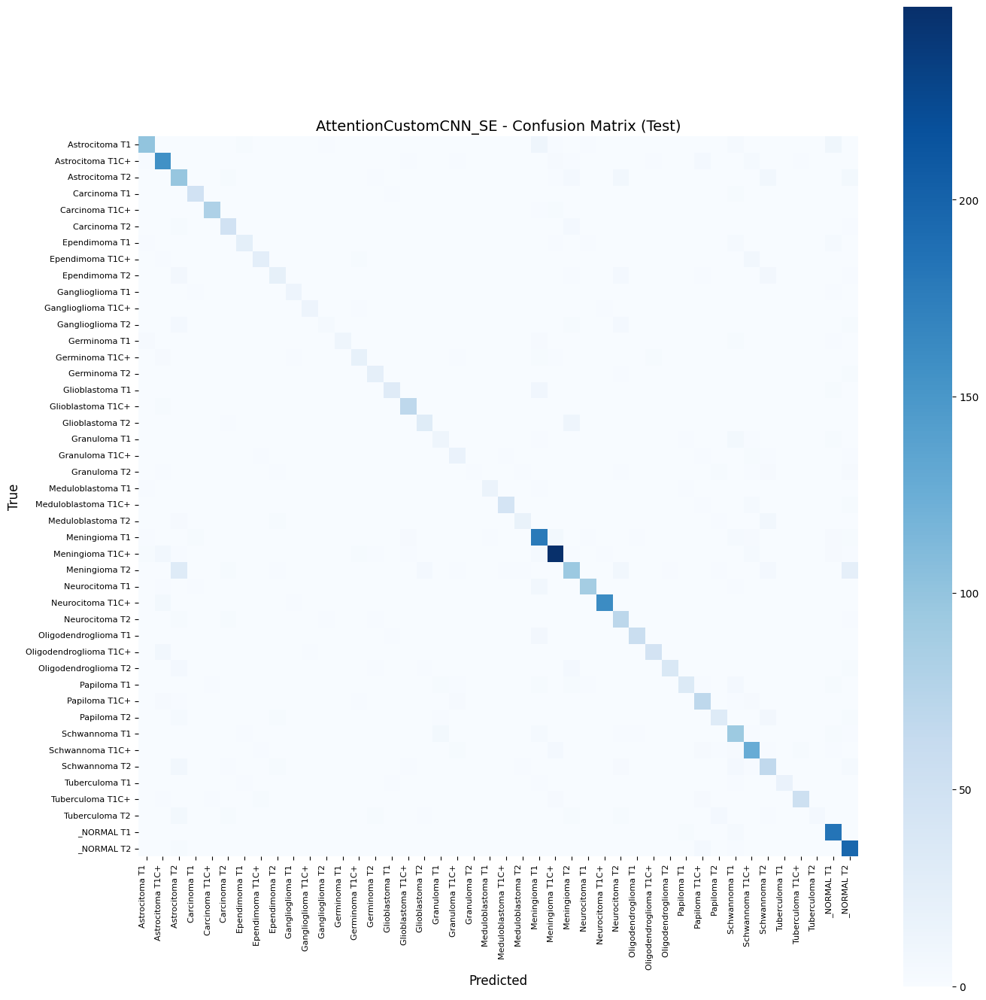

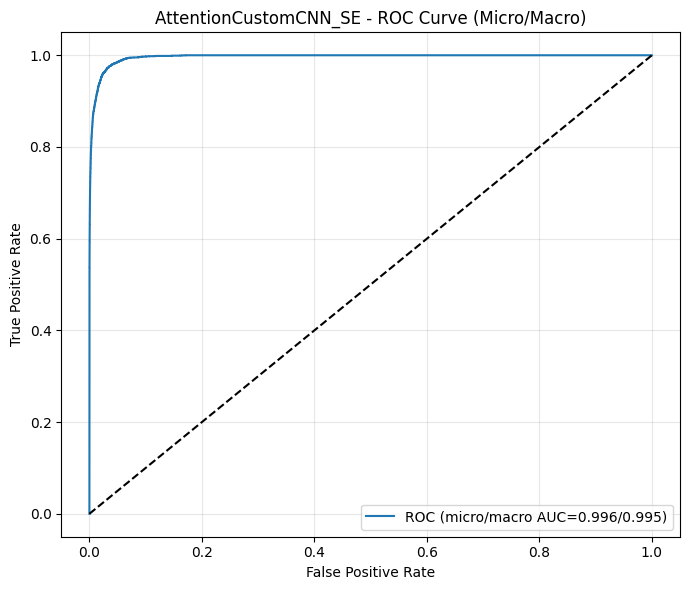

Macro AUC: 0.9949 | Micro AUC: 0.9961

[AttentionCustomCNN_SE] Timing:
Training time: 1643.99 s
Testing time: 6.36 s
Average inference time per image: 4.47 ms



In [18]:
import time, random, numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from sklearn.metrics import (
    classification_report, confusion_matrix,
    roc_auc_score, roc_curve
)
from sklearn.preprocessing import label_binarize
import matplotlib.pyplot as plt
import seaborn as sns

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class SEBlock(nn.Module):
    def __init__(self, channels, reduction=16):
        super().__init__()
        self.pool = nn.AdaptiveAvgPool2d(1)
        self.fc = nn.Sequential(
            nn.Linear(channels, channels // reduction, bias=False),
            nn.ReLU(inplace=True),
            nn.Linear(channels // reduction, channels, bias=False),
            nn.Sigmoid()
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.pool(x).view(b, c)
        y = self.fc(y).view(b, c, 1, 1)
        return x * y

class AttentionCustomCNN(nn.Module):
    def __init__(self, num_classes):
        super().__init__()
        self.block1 = nn.Sequential(
            nn.Conv2d(3, 32, 3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(inplace=True),
            SEBlock(32),
            nn.MaxPool2d(2),
        )
        self.block2 = nn.Sequential(
            nn.Conv2d(32, 64, 3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(inplace=True),
            SEBlock(64),
            nn.MaxPool2d(2),
        )
        self.block3 = nn.Sequential(
            nn.Conv2d(64, 128, 3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(inplace=True),
            SEBlock(128),
            nn.MaxPool2d(2),
        )
        self.block4 = nn.Sequential(
            nn.Conv2d(128, 256, 3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(inplace=True),
            SEBlock(256),
            nn.MaxPool2d(2),
        )
        self.avgpool = nn.AdaptiveAvgPool2d((1, 1))
        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(256, 256),
            nn.ReLU(inplace=True),
            nn.Dropout(p=0.5),
            nn.Linear(256, num_classes)
        )

    def forward(self, x):
        x = self.block1(x)
        x = self.block2(x)
        x = self.block3(x)
        x = self.block4(x)
        x = self.avgpool(x)
        x = self.classifier(x)
        return x

criterion = nn.CrossEntropyLoss()

def run_epoch(model, loader, optimizer=None, train_mode=True):
    if train_mode:
        model.train()
    else:
        model.eval()
    running_loss, running_correct, total = 0.0, 0, 0
    for images, targets in loader:
        images, targets = images.to(device), targets.to(device)
        if train_mode:
            optimizer.zero_grad()
        with torch.set_grad_enabled(train_mode):
            outputs = model(images)
            loss = criterion(outputs, targets)
            if train_mode:
                loss.backward()
                optimizer.step()
        preds = outputs.argmax(dim=1)
        running_loss += loss.item() * images.size(0)
        running_correct += (preds == targets).sum().item()
        total += images.size(0)
    epoch_loss = running_loss / max(total, 1)
    epoch_acc = running_correct / max(total, 1)
    return epoch_loss, epoch_acc

@torch.no_grad()
def collect_preds_and_probs(model, loader):
    model.eval()
    all_probs, all_preds, all_targets = [], [], []
    for images, targets in loader:
        images = images.to(device)
        logits = model(images)
        probs = torch.softmax(logits, dim=1)
        preds = probs.argmax(dim=1).cpu().numpy()
        all_probs.append(probs.cpu().numpy())
        all_preds.append(preds)
        all_targets.append(targets.numpy())
    all_probs = np.concatenate(all_probs)
    all_preds = np.concatenate(all_preds)
    all_targets = np.concatenate(all_targets)
    return all_targets, all_preds, all_probs

@torch.no_grad()
def measure_inference_time(model, dataset, max_samples=100):
    indices = list(range(len(dataset)))
    random.shuffle(indices)
    indices = indices[:min(max_samples, len(indices))]
    loader = torch.utils.data.DataLoader(
        torch.utils.data.Subset(dataset, indices),
        batch_size=1, shuffle=False, num_workers=0, pin_memory=torch.cuda.is_available()
    )
    if device.type == "cuda":
        torch.cuda.empty_cache()
    for i, (x, _) in enumerate(loader):
        x = x.to(device)
        _ = model(x)
        if i >= 5:
            break
    start = time.time()
    for x, _ in loader:
        x = x.to(device)
        if device.type == "cuda":
            torch.cuda.synchronize()
        _ = model(x)
        if device.type == "cuda":
            torch.cuda.synchronize()
    end = time.time()
    n = len(indices)
    return (end - start) / n if n > 0 else float("nan")

def plot_confusion_matrix(y_true, y_pred, labels, title):
    cm = confusion_matrix(y_true, y_pred, labels=range(len(labels)))
    plt.figure(figsize=(14, 14))
    sns.heatmap(cm, cmap="Blues", cbar=True, square=True,
                xticklabels=labels, yticklabels=labels,
                annot=False)
    plt.xticks(rotation=90, ha="right", fontsize=8)
    plt.yticks(rotation=0, fontsize=8)
    plt.title(title, fontsize=14)
    plt.xlabel("Predicted", fontsize=12)
    plt.ylabel("True", fontsize=12)
    plt.tight_layout()
    plt.show()

def plot_roc_auc(y_true, y_prob, labels, title):
    y_true_bin = label_binarize(y_true, classes=list(range(len(labels))))
    macro_auc = roc_auc_score(y_true_bin, y_prob, multi_class="ovr", average="macro")
    micro_auc = roc_auc_score(y_true_bin, y_prob, multi_class="ovr", average="micro")
    fpr, tpr, _ = roc_curve(y_true_bin.ravel(), y_prob.ravel())
    plt.figure(figsize=(7, 6))
    plt.plot(fpr, tpr, label=f"ROC (micro/macro AUC={micro_auc:.3f}/{macro_auc:.3f})")
    plt.plot([0, 1], [0, 1], "k--")
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title(title)
    plt.legend(loc="lower right")
    plt.grid(alpha=0.3)
    plt.tight_layout()
    plt.show()
    print(f"Macro AUC: {macro_auc:.4f} | Micro AUC: {micro_auc:.4f}")

def per_class_accuracy(y_true, y_pred, labels):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    print("\nPer-class accuracy:")
    for idx, name in enumerate(labels):
        mask = (y_true == idx)
        if mask.sum() == 0:
            acc = float("nan")
        else:
            acc = (y_pred[mask] == y_true[mask]).mean()
        print(f"{name:25s}: {acc:.4f}")

def train_and_evaluate_attention(model, model_name, epochs, patience, lr, weight_decay):
    model = model.to(device)
    optimizer = optim.Adam(model.parameters(), lr=lr, weight_decay=weight_decay)
    best_val_loss = float("inf")
    best_state = None
    epochs_no_improve = 0

    t_train_start = time.time()
    for epoch in range(1, epochs + 1):
        train_loss, train_acc = run_epoch(model, train_loader, optimizer, train_mode=True)
        val_loss, val_acc = run_epoch(model, val_loader, train_mode=False)
        print(f"[{model_name}] Epoch {epoch:02d}/{epochs} | "
              f"Train Loss: {train_loss:.4f} Acc: {train_acc:.4f} | "
              f"Val Loss: {val_loss:.4f} Acc: {val_acc:.4f}")
        if val_loss < best_val_loss:
            best_val_loss = val_loss
            epochs_no_improve = 0
            best_state = {k: v.cpu() for k, v in model.state_dict().items()}
        else:
            epochs_no_improve += 1
            if epochs_no_improve >= patience:
                print(f"[{model_name}] Early stopping at epoch {epoch}.")
                break
    t_train_end = time.time()
    train_time_s = t_train_end - t_train_start

    if best_state is not None:
        model.load_state_dict({k: v.to(device) for k, v in best_state.items()})

    print(f"\n[{model_name}] Model summary (post-training):")
    print_model_summary(model)

    print(f"\n[{model_name}] Classification report - TRAIN:")
    y_tr_true, y_tr_pred, _ = collect_preds_and_probs(model, train_loader)
    print(classification_report(y_tr_true, y_tr_pred, target_names=class_names,
                                zero_division=0, digits=4))
    per_class_accuracy(y_tr_true, y_tr_pred, class_names)

    print(f"\n[{model_name}] Classification report - VAL:")
    y_va_true, y_va_pred, _ = collect_preds_and_probs(model, val_loader)
    print(classification_report(y_va_true, y_va_pred, target_names=class_names,
                                zero_division=0, digits=4))
    per_class_accuracy(y_va_true, y_va_pred, class_names)

    print(f"\n[{model_name}] Classification report - TEST:")
    t_test_start = time.time()
    y_te_true, y_te_pred, y_te_prob = collect_preds_and_probs(model, test_loader)
    t_test_end = time.time()
    test_time_s = t_test_end - t_test_start
    print(classification_report(y_te_true, y_te_pred, target_names=class_names,
                                zero_division=0, digits=4))
    per_class_accuracy(y_te_true, y_te_pred, class_names)

    plot_confusion_matrix(y_te_true, y_te_pred, class_names,
                          f"{model_name} - Confusion Matrix (Test)")
    plot_roc_auc(y_te_true, y_te_prob, class_names,
                 f"{model_name} - ROC Curve (Micro/Macro)")

    avg_inf_s = measure_inference_time(model, test_ds, max_samples=100)

    print(f"\n[{model_name}] Timing:")
    print(f"Training time: {train_time_s:.2f} s")
    print(f"Testing time: {test_time_s:.2f} s")
    print(f"Average inference time per image: {avg_inf_s*1000:.2f} ms\n")

    return model

print("\n=== Training Attention-Enhanced Custom CNN (SE Block) ===")
attn_cnn = AttentionCustomCNN(num_classes=num_classes)
attn_cnn = train_and_evaluate_attention(
    model=attn_cnn,
    model_name="AttentionCustomCNN_SE",
    epochs=100,
    patience=5,
    lr=1e-3,
    weight_decay=0.0
)




## **Model Comparison Summary**

This study evaluated five deep learning architectures for multi-class brain tumor MRI classification across 44 categories. Three models were pretrained on ImageNet (ResNet-18, DenseNet-121, VGG-16), while two models were trained from scratch (Custom CNN and an Attention-Enhanced CNN integrating Squeeze-and-Excitation blocks). The models were compared using test accuracy, macro-averaged performance metrics, ROC-AUC, training/testing time, and inference speed.

**DenseNet-121 achieved the highest overall performance**, reaching a test accuracy of **99.41%**, macro F1 of **0.9954**, and perfect macro/micro AUC scores of **1.0000**. However, it required significantly longer training and inference times due to its depth and computational complexity.

**ResNet-18 provided the best balance between accuracy and efficiency**, achieving a test accuracy of **99.23%** and perfect AUC scores, while training more than three times faster than DenseNet-121 and offering much quicker inference speed. This makes ResNet-18 the most practical high-performance model for deployment.

**VGG-16**, although achieving a strong accuracy of **97.49%**, underperformed compared to the other pretrained models and demonstrated the slowest runtime, reflecting its older architecture design.

Both **Custom CNN** and **Attention-Enhanced CNN** achieved substantially lower accuracy (**82.1%**) compared to pretrained models. The inclusion of SE attention blocks improved some class-wise metrics and stabilization but did not drastically increase overall accuracy. These results highlight the difficulty of learning highly complex 44-class medical representations from scratch without large-scale pretraining. However, these models demonstrated the fastest inference times, making them computationally efficient.

Overall, the results confirm that **transfer learning with modern pretrained architectures significantly outperforms models trained from scratch** for high-granularity medical image classification. DenseNet-121 is the top performer, while ResNet-18 presents the most favorable trade-off between accuracy, generalization, and computational cost.
